In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.figure_factory as ff
import plotly.plotly as py
import scipy.stats as st
from sklearn import linear_model
import re
import numpy as np

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
plt.style.use('ggplot')

In [3]:
#Loading the datasets
demographics = pd.read_csv('demographics_train.csv')
election = pd.read_csv('election_train.csv')
states = pd.read_csv('states.csv')

In [4]:
#Inspecting Demographics:
demographics.head()

,County,State,2014 Population,2010 Population,Population Percent Change,Percent Under 5 Years,Percent Under 18 Years,Percent 65 and Older,Percent Female,Percent White,Percent Black or African American,Percent American Indian and Alaska Native,Percent Asian,Percent Native Hawaiian and Other Pacific Islander,Percent Two or More Races,Percent Hispanic or Latino,"Percent White, not Hispanic or Latino",Veterans,Percent Foreign Born,Percent High School or Higher,Percent Bachelor's Degree or Higher,Housing Units,Percent Housing Units in Multi-Unit Structures,Homeownership Rate,Median Value of Owner-Occupied Units,Building Permits,Households,Persons per Household,Percent Living in Same House +1 Years,Percent Language Other than English at Home,Mean Travel Time to Work,Median Household Income,Per Capita Income,Percent Below Poverty Level,Accommodation and Food Services Sales,Manufacturers Shipments,Merchant Wholesaler Sales,Retail Sales,Retail Sales per Capita,Population per Square Mile,Land Area
0,Clinton County,IN,32776,33224,-1.3,6.9,26.3,15.8,50.5,97.8,0.6,0.4,0.3,0.0,0.9,14.9,83.4,2051,6.5,84.7,13.0,13248,12.7,72.1,97300,24,11745,2.76,84.7,12.5,22.1,48953,21554,13.9,250,22834,0,2235,6579,82.0,405.07
1,Trego County,KS,2902,3001,-3.3,4.4,18.0,24.2,50.6,97.4,0.7,0.3,0.4,0.1,1.1,2.0,95.6,306,1.5,90.2,21.5,1676,9.9,74.8,74500,0,1232,2.35,83.9,5.4,14.8,45714,23095,6.7,40,0,241,404,13740,3.4,889.48
2,Cass County,NE,25524,25241,1.1,6.0,24.6,16.1,49.6,97.0,0.5,0.5,0.5,0.1,1.5,3.1,94.3,3091,1.3,94.0,23.6,11250,6.8,79.2,146700,63,9701,2.57,90.7,3.4,27.0,64697,29638,6.4,142,0,990,1836,7196,45.3,557.45
3,Walton County,GA,87615,83768,4.6,6.2,25.9,14.2,51.3,79.6,17.0,0.4,1.4,0.1,1.5,3.9,76.5,5764,4.4,83.1,18.4,32544,9.3,75.1,157100,271,29520,2.84,86.9,6.4,31.3,52369,22824,13.8,583,5918,2604,7971,9577,257.2,325.68
4,Norfolk County,MA,692254,670850,3.2,5.4,21.6,15.7,52.1,80.9,6.9,0.2,10.2,0.0,1.8,4.0,77.8,38108,15.5,93.7,49.2,272940,37.2,69.3,391100,1594,257451,2.56,88.7,19.0,31.5,84916,44692,6.6,12940,103407,123988,112414,17133,1693.6,396.11


In [5]:
print('demographics dimensions:{}'.format(demographics.shape))

demographics dimensions:(2329, 41)


In [6]:
print('election dimensions:{}'.format(election.shape))

election dimensions:(3132, 50)


In [7]:
print('states dimensions:{}'.format(states.shape))

states dimensions:(51, 2)


In [8]:
#Task 1:
#Merging the dataset states and election on 'State'
data1 = pd.merge(election,states, on='State')

In [9]:
data1.shape


(3132, 51)

In [10]:
#Renaming the column 'State' with 'StateAbbreviation'
demographics.rename(columns={'State':'StateAbbreviation'},inplace=True)
list(demographics)

['County',
 'StateAbbreviation',
 '2014 Population',
 '2010 Population',
 'Population Percent Change',
 'Percent Under 5 Years',
 'Percent Under 18 Years',
 'Percent 65 and Older',
 'Percent Female',
 'Percent White',
 'Percent Black or African American',
 'Percent American Indian and Alaska Native',
 'Percent Asian',
 'Percent Native Hawaiian and Other Pacific Islander',
 'Percent Two or More Races',
 'Percent Hispanic or Latino',
 'Percent White, not Hispanic or Latino',
 'Veterans',
 'Percent Foreign Born',
 'Percent High School or Higher',
 "Percent Bachelor's Degree or Higher",
 'Housing Units',
 'Percent Housing Units in Multi-Unit Structures',
 'Homeownership Rate',
 'Median Value of Owner-Occupied Units',
 'Building Permits',
 'Households',
 'Persons per Household',
 'Percent Living in Same House +1 Years',
 'Percent Language Other than English at Home',
 'Mean Travel Time to Work',
 'Median Household Income',
 'Per Capita Income',
 'Percent Below Poverty Level',
 'Accommodatio

In [11]:
#Creating a new dataset result which merges data1 and demographics datasets based on StateAbbreviation and County
result = pd.merge(demographics,data1, on=['StateAbbreviation','County'])

In [12]:
#As in the demographics dataset, each county name is followed by the string 'County' which is not the case with election dataset
demographics['County'] = demographics['County'].str.replace('County','').str.strip()

In [13]:
demographics['County']

0                           Clinton
1                             Trego
2                              Cass
3                            Walton
4                           Norfolk
5                         Crow Wing
6                            Beaver
7                          Sedgwick
8                            Pierce
9                            Morton
10                          Clatsop
11                           Forest
12                           Barton
13                        McCurtain
14                          Screven
15                        Humphreys
16                          Fairfax
17                            Boone
18                            Essex
19                            Macon
20                          Wheeler
21                        Hunterdon
22                            Grant
23                         Umatilla
24                            Pepin
25                           DeKalb
26                        Bon Homme
27                        Su

In [14]:
#Stripping the word 'County' from data1 also:
data1['County'] = data1['County'].str.replace('County','').str.strip()

In [15]:
data1['County']

0                        Clinton
1                          Boone
2                       Delaware
3                           Owen
4                         Gibson
5                         Jasper
6                         Putnam
7                          Parke
8                      Kosciusko
9                           Clay
10                           Jay
11                         Posey
12                      Fountain
13                       Whitley
14                        Starke
15                      Marshall
16                       Madison
17                      Franklin
18                      LaGrange
19                        Tipton
20                        Benton
21                          Knox
22                          Rush
23                       Steuben
24                         Noble
25                       Decatur
26                         Allen
27                      Randolph
28                        Greene
29                   Vanderburgh
30        

In [16]:
#While observing the dimensions of result dataset, it does not contain the interesction because of a word 'Parish' in some of the County names:
data1[(~data1.County.isin(result.County))&(~data1.StateAbbreviation.isin(result.StateAbbreviation))]

,County,State,Ben Carson.Number of Votes,Ben Carson.Party,Ben Carson.Percent of Votes,Bernie Sanders.Number of Votes,Bernie Sanders.Party,Bernie Sanders.Percent of Votes,Carly Fiorina.Number of Votes,Carly Fiorina.Party,Carly Fiorina.Percent of Votes,Chris Christie.Number of Votes,Chris Christie.Party,Chris Christie.Percent of Votes,Donald Trump.Number of Votes,Donald Trump.Party,Donald Trump.Percent of Votes,Hillary Clinton.Number of Votes,Hillary Clinton.Party,Hillary Clinton.Percent of Votes,Jeb Bush.Number of Votes,Jeb Bush.Party,Jeb Bush.Percent of Votes,John Kasich.Number of Votes,John Kasich.Party,John Kasich.Percent of Votes,Marco Rubio.Number of Votes,Marco Rubio.Party,Marco Rubio.Percent of Votes,Martin O'Malley.Number of Votes,Martin O'Malley.Party,Martin O'Malley.Percent of Votes,Mike Huckabee.Number of Votes,Mike Huckabee.Party,Mike Huckabee.Percent of Votes,Rand Paul.Number of Votes,Rand Paul.Party,Rand Paul.Percent of Votes,Rick Santorum.Number of Votes,Rick Santorum.Party,Rick Santorum.Percent of Votes,Ted Cruz.Number of Votes,Ted Cruz.Party,Ted Cruz.Percent of Votes,No Preference.Number of Votes,No Preference.Party,No Preference.Percent of Votes,Uncommitted.Number of Votes,Uncommitted.Party,Uncommitted.Percent of Votes,StateAbbreviation
0,Clinton,Indiana,0,Republican,0.000000,1046,Democrat,59.100000,0,Republican,0.000000,0,Republican,0.000000,3252,Republican,49.200000,724,Democrat,40.900000,0,Republican,0.000000,474,Republican,7.200000,0,Republican,0.000000,0,Democrat,0.0,0,Republican,0.0,0,Republican,0.0,0,Republican,0.0,2637,Republican,39.900000,0,NaN,0.0,0,NaN,0.0,IN
1,Boone,Indiana,0,Republican,0.000000,2555,Democrat,55.200000,0,Republican,0.000000,0,Republican,0.000000,7023,Republican,45.700000,2075,Democrat,44.800000,0,Republican,0.000000,1728,Republican,11.300000,0,Republican,0.000000,0,Democrat,0.0,0,Republican,0.0,0,Republican,0.0,0,Republican,0.0,6223,Republican,40.500000,0,NaN,0.0,0,NaN,0.0,IN
2,Delaware,Indiana,0,Republican,0.000000,7728,Democrat,55.700000,0,Republican,0.000000,0,Republican,0.000000,8793,Republican,52.800000,6137,Democrat,44.300000,0,Republican,0.000000,1255,Republican,7.500000,0,Republican,0.000000,0,Democrat,0.0,0,Republican,0.0,0,Republican,0.0,0,Republican,0.0,6153,Republican,37.000000,0,NaN,0.0,0,NaN,0.0,IN
3,Owen,Indiana,0,Republican,0.000000,1056,Democrat,62.600000,0,Republican,0.000000,0,Republican,0.000000,2679,Republican,64.300000,631,Democrat,37.400000,0,Republican,0.000000,165,Republican,4.000000,0,Republican,0.000000,0,Democrat,0.0,0,Republican,0.0,0,Republican,0.0,0,Republican,0.0,1217,Republican,29.200000,0,NaN,0.0,0,NaN,0.0,IN
4,Gibson,Indiana,0,Republican,0.000000,1453,Democrat,49.500000,0,Republican,0.000000,0,Republican,0.000000,4237,Republican,60.100000,1484,Democrat,50.500000,0,Republican,0.000000,369,Republican,5.200000,0,Republican,0.000000,0,Democrat,0.0,0,Republican,0.0,0,Republican,0.0,0,Republican,0.0,2263,Republican,32.100000,0,NaN,0.0,0,NaN,0.0,IN
5,Jasper,Indiana,0,Republican,0.000000,1323,Democrat,59.200000,0,Republican,0.000000,0,Republican,0.000000,3903,Republican,57.900000,910,Democrat,40.800000,0,Republican,0.000000,494,Republican,7.300000,0,Republican,0.000000,0,Democrat,0.0,0,Republican,0.0,0,Republican,0.0,0,Republican,0.0,2120,Republican,31.500000,0,NaN,0.0,0,NaN,0.0,IN
6,Putnam,Indiana,0,Republican,0.000000,1189,Democrat,55.000000,0,Republican,0.000000,0,Republican,0.000000,4087,Republican,56.000000,974,Democrat,45.000000,0,Republican,0.000000,309,Republican,4.200000,0,Republican,0.000000,0,Democrat,0.0,0,Republican,0.0,0,Republican,0.0,0,Republican,0.0,2737,Republican,37.500000,0,NaN,0.0,0,NaN,0.0,IN
7,Parke,Indiana,0,Republican,0.000000,539,Democrat,57.900000,0,Republican,0.000000,0,Republican,0.000000,1996,Republican,63.400000,392,Democrat,42.100000,0,Republican,0.000000,142,Republican,4.500000,0,Republican,0.000000,0,Democrat,0.0,0,Republican,0.0,0,Republican,0.0,0,Republican,0.0,921,Republican,29.200000,0,NaN,0.0,0,NaN,0.0,IN
8,Kosciusko

In [17]:
#Removing the word 'Parish' from demographics county name
demographics['County'] = demographics['County'].str.replace('Parish','').str.strip()

In [18]:
#Forming the new result dataset after cleaning up the dataset:
result = pd.merge(demographics,data1, on=['StateAbbreviation','County'])

In [19]:
result.shape

(2115, 90)

In [20]:
#Number of variables= 90
#Type of variables in dataset result:
result.dtypes

County                                                 object
StateAbbreviation                                      object
2014 Population                                         int64
2010 Population                                         int64
Population Percent Change                             float64
Percent Under 5 Years                                 float64
Percent Under 18 Years                                float64
Percent 65 and Older                                  float64
Percent Female                                        float64
Percent White                                         float64
Percent Black or African American                     float64
Percent American Indian and Alaska Native             float64
Percent Asian                                         float64
Percent Native Hawaiian and Other Pacific Islander    float64
Percent Two or More Races                             float64
Percent Hispanic or Latino                            float64
Percent 

In [21]:
#exploring the summary statistics of all numerical features
result.describe()

,2014 Population,2010 Population,Population Percent Change,Percent Under 5 Years,Percent Under 18 Years,Percent 65 and Older,Percent Female,Percent White,Percent Black or African American,Percent American Indian and Alaska Native,Percent Asian,Percent Native Hawaiian and Other Pacific Islander,Percent Two or More Races,Percent Hispanic or Latino,"Percent White, not Hispanic or Latino",Veterans,Percent Foreign Born,Percent High School or Higher,Percent Bachelor's Degree or Higher,Housing Units,Percent Housing Units in Multi-Unit Structures,Homeownership Rate,Median Value of Owner-Occupied Units,Building Permits,Households,Persons per Household,Percent Living in Same House +1 Years,Percent Language Other than English at Home,Mean Travel Time to Work,Median Household Income,Per Capita Income,Percent Below Poverty Level,Accommodation and Food Services Sales,Manufacturers Shipments,Merchant Wholesaler Sales,Retail Sales,Retail Sales per Capita,Population per Square Mile,Land Area,Ben Carson.Number of Votes,Ben Carson.Percent of Votes,Bernie Sanders.Number of Votes,Bernie Sanders.Percent of Votes,Carly Fiorina.Number of Votes,Carly Fiorina.Percent of Votes,Chris Christie.Number of Votes,Chris Christie.Percent of Votes,Donald Trump.Number of Votes,Donald Trump.Percent of Votes,Hillary Clinton.Number of Votes,Hillary Clinton.Percent of Votes,Jeb Bush.Number of Votes,Jeb Bush.Percent of Votes,John Kasich.Number of Votes,John Kasich.Percent of Votes,Marco Rubio.Number of Votes,Marco Rubio.Percent of Votes,Martin O'Malley.Number of Votes,Martin O'Malley.Percent of Votes,Mike Huckabee.Number of Votes,Mike Huckabee.Percent of Votes,Rand Paul.Number of Votes,Rand Paul.Percent of Votes,Rick Santorum.Number of Votes,Rick Santorum.Percent of Votes,Ted Cruz.Number of Votes,Ted Cruz.Percent of Votes,No Preference.Number of Votes,No Preference.Party,No Preference.Percent of Votes,Uncommitted.Number of Votes,Uncommitted.Party,Uncommitted.Percent of Votes
count,2.115000e+03,2.115000e+03,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2.115000e+03,2115.000000,2115.000000,2115.000000,2115.000000,2.115000e+03,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2.115000e+03,2.115000e+03,2.115000e+03,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,0.0,2115.000000,2115.000000,0.0,2115.000000
mean,1.070321e+05,1.034306e+05,0.393050,5.855887,22.470591,17.529031,49.946619,84.934232,9.804539,1.852624,1.426241,0.112719,1.862884,9.468558,76.498251,7150.045390,4.663499,84.084681,19.624255,4.472344e+04,12.336265,72.002175,131867.801418,366.052955,3.853572e+04,2.535712,86.307801,9.464681,23.345816,45363.818440,23283.699764,17.145012,2043.006619,1.508603e+04,1.225704e+04,1.307949e+04,10270.905437,227.926288,967.300846,189.182033,2.549517,3723.163593,43.364924,4.149882,0.091959,6.284161,0.070886,4436.516785,45.138343,5096.276123,53.248220,27.558392,0.236550,1292.443499,8.852120,1153.682742,9.235439,0.304492,0.033191,1.293617,0.089740,3.373995,0.130496,0.727187,0.039527,2605.233097,26.856487,0.099291,NaN,0.001939,0.017494,NaN,0.001655
std,3.503700e+05,3.348429e+05,3.872765,1.190171,3.379592,4.320226,2.331456,15.957276,14.864699,5.884736,2.801368,0.482488,1.477692,14.279237,20.101406,17566.162371,5.740374,7.087833,9.021844,1.317506e+05,8.980461,7.744867,78668.193825,1490.866617,1.171718e+05,0.236307,4.387516,11.995656,5.248979,12089.737945,5567.468576,6.572535,9216.171397,6.311523e+04,7.631825e+04,4.390559e+04,5719.604587,902.938679,1379.806

In [22]:
# Number of missing values for each attribute
result.isnull().sum()

County                                                   0
StateAbbreviation                                        0
2014 Population                                          0
2010 Population                                          0
Population Percent Change                                0
Percent Under 5 Years                                    0
Percent Under 18 Years                                   0
Percent 65 and Older                                     0
Percent Female                                           0
Percent White                                            0
Percent Black or African American                        0
Percent American Indian and Alaska Native                0
Percent Asian                                            0
Percent Native Hawaiian and Other Pacific Islander       0
Percent Two or More Races                                0
Percent Hispanic or Latino                               0
Percent White, not Hispanic or Latino                   

In [23]:
#Dealing with missing values
#As the entire column of No Preference Party and Uncommitted Party have Null values, it is better to drop them
result = result.drop(['No Preference.Party','Uncommitted.Party'], axis =1)

In [24]:
#Creating a new column Democratic that consist of all the Votes for that party 
result['Democratic'] = result['Bernie Sanders.Number of Votes'] + result['Hillary Clinton.Number of Votes'] + result['Martin O\'Malley.Number of Votes']
    

In [25]:
result['Democratic']

0          1770
1           283
2          3278
3          1716
4         22526
5            21
6          5962
7           472
8           419
9          2026
10          937
11         3028
12       137115
13         1190
14         4171
15        10935
16            6
17        10420
18          990
19         4292
20          995
21       114920
22          422
23         2631
24          298
25         7665
26         2620
27         8973
28        12679
29         2486
30          949
31           52
32         5106
33        28737
34          174
35         2990
36         4021
37        37509
38         4630
39          991
40         1670
41        12759
42         8999
43         7950
44         3080
45         1397
46        17617
47         1291
48          496
49          275
50          399
51          124
52         1583
53          137
54         3650
55         1432
56         2640
57         5939
58           79
59          161
60         1497
61         2543
62      

In [26]:
#name of the columns that belong to the Republican Party
result.columns[result.iloc[0].isin(['Republican'])]

Index(['Ben Carson.Party', 'Carly Fiorina.Party', 'Chris Christie.Party',
       'Donald Trump.Party', 'Jeb Bush.Party', 'John Kasich.Party',
       'Marco Rubio.Party', 'Mike Huckabee.Party', 'Rand Paul.Party',
       'Rick Santorum.Party', 'Ted Cruz.Party'],
      dtype='object')

In [27]:
#Forming a new column Republican which consist of the number of votes for that party for the respective county:
result['Republican'] = result['Ben Carson.Number of Votes']+ result['Carly Fiorina.Number of Votes']+ result['Chris Christie.Number of Votes']+ result['Donald Trump.Number of Votes']+ result['Jeb Bush.Number of Votes']+ result['John Kasich.Number of Votes']+ result['Marco Rubio.Number of Votes']+ result['Mike Huckabee.Number of Votes']+ result['Rand Paul.Number of Votes'] + result['Rick Santorum.Number of Votes']+ result['Ted Cruz.Number of Votes']

In [28]:
result['Republican']

0         6363
1         2767
2        18818
3         1686
4        19081
5            0
6         3419
7          915
8         2819
9         1331
10        1723
11         669
12      128853
13        6124
14        2047
15       16167
16         114
17       16399
18        3175
19        7192
20        1307
21       43512
22         508
23        1437
24         541
25       13501
26        2674
27       26228
28        6909
29        6390
30         666
31         277
32       17778
33       35723
34        2903
35        3035
36        6594
37       36765
38       14974
39        2911
40        6874
41       29159
42       48727
43       17269
44         866
45        4040
46       28420
47        2107
48         535
49        2084
50         872
51        6024
52        6086
53        3266
54        2469
55        4300
56        3596
57       11041
58           0
59         151
60        1317
61        3194
62        2622
63         288
64        3430
65        2466
66       1

In [29]:
#Comparing the number of votes of Democratic and Republican party to form a new column Party which maps 1 for Democratic and 0 for Republican
result['Party'] = result['Democratic']>result['Republican']
change_values = {True : 1, False : 0}
result['Party'] = result['Party'].map(change_values)

In [30]:
result['Party']

0       0
1       0
2       0
3       1
4       1
5       1
6       1
7       0
8       0
9       1
10      0
11      1
12      1
13      0
14      1
15      0
16      0
17      0
18      0
19      0
20      0
21      1
22      0
23      1
24      0
25      0
26      0
27      0
28      1
29      0
30      1
31      0
32      0
33      0
34      0
35      0
36      0
37      1
38      0
39      0
40      0
41      0
42      0
43      0
44      1
45      0
46      0
47      0
48      0
49      0
50      0
51      0
52      0
53      0
54      1
55      0
56      0
57      0
58      1
59      1
60      1
61      0
62      0
63      1
64      0
65      1
66      0
67      0
68      1
69      0
70      0
71      0
72      1
73      0
74      0
75      0
76      0
77      0
78      0
79      0
80      1
81      0
82      1
83      0
84      1
85      0
86      1
87      1
88      0
89      0
90      0
91      0
92      0
93      0
94      1
95      1
96      0
97      0
98      0
99      0


In [31]:
#Task 6
#Get the democratic counties
dems= result[result['Party']==1]
#Get the republican counties
repbs= result[result['Party']==0]

In [32]:
#Printing the mean values
print(dems['2014 Population'].mean())
print(repbs['2014 Population'].mean())
#Getting t-test values
res=st.ttest_ind(dems['2014 Population'],repbs['2014 Population'],equal_var=False)
print(res)


185786.7245614035
77977.03236245955
Ttest_indResult(statistic=4.544633874604388, pvalue=6.569439214235333e-06)


In [33]:
#Task 7
#Printing mean of median household income:
print(dems['Median Household Income'].mean())
print(repbs['Median Household Income'].mean())
#Getting t-test values
res_median_hi=st.ttest_ind(dems['Median Household Income'],repbs['Median Household Income'],equal_var=False)
print(res_median_hi)

45643.87192982456
45260.49773462783
Ttest_indResult(statistic=0.5487965880651855, pvalue=0.5833024619069044)


In [34]:
#Task8:
#Getting the Descriptive statistics:
result.describe()

,2014 Population,2010 Population,Population Percent Change,Percent Under 5 Years,Percent Under 18 Years,Percent 65 and Older,Percent Female,Percent White,Percent Black or African American,Percent American Indian and Alaska Native,Percent Asian,Percent Native Hawaiian and Other Pacific Islander,Percent Two or More Races,Percent Hispanic or Latino,"Percent White, not Hispanic or Latino",Veterans,Percent Foreign Born,Percent High School or Higher,Percent Bachelor's Degree or Higher,Housing Units,Percent Housing Units in Multi-Unit Structures,Homeownership Rate,Median Value of Owner-Occupied Units,Building Permits,Households,Persons per Household,Percent Living in Same House +1 Years,Percent Language Other than English at Home,Mean Travel Time to Work,Median Household Income,Per Capita Income,Percent Below Poverty Level,Accommodation and Food Services Sales,Manufacturers Shipments,Merchant Wholesaler Sales,Retail Sales,Retail Sales per Capita,Population per Square Mile,Land Area,Ben Carson.Number of Votes,Ben Carson.Percent of Votes,Bernie Sanders.Number of Votes,Bernie Sanders.Percent of Votes,Carly Fiorina.Number of Votes,Carly Fiorina.Percent of Votes,Chris Christie.Number of Votes,Chris Christie.Percent of Votes,Donald Trump.Number of Votes,Donald Trump.Percent of Votes,Hillary Clinton.Number of Votes,Hillary Clinton.Percent of Votes,Jeb Bush.Number of Votes,Jeb Bush.Percent of Votes,John Kasich.Number of Votes,John Kasich.Percent of Votes,Marco Rubio.Number of Votes,Marco Rubio.Percent of Votes,Martin O'Malley.Number of Votes,Martin O'Malley.Percent of Votes,Mike Huckabee.Number of Votes,Mike Huckabee.Percent of Votes,Rand Paul.Number of Votes,Rand Paul.Percent of Votes,Rick Santorum.Number of Votes,Rick Santorum.Percent of Votes,Ted Cruz.Number of Votes,Ted Cruz.Percent of Votes,No Preference.Number of Votes,No Preference.Percent of Votes,Uncommitted.Number of Votes,Uncommitted.Percent of Votes,Democratic,Republican,Party
count,2.115000e+03,2.115000e+03,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2.115000e+03,2115.000000,2115.000000,2115.000000,2115.000000,2.115000e+03,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2.115000e+03,2.115000e+03,2.115000e+03,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2115.000000,2.115000e+03,2115.00000,2115.000000
mean,1.070321e+05,1.034306e+05,0.393050,5.855887,22.470591,17.529031,49.946619,84.934232,9.804539,1.852624,1.426241,0.112719,1.862884,9.468558,76.498251,7150.045390,4.663499,84.084681,19.624255,4.472344e+04,12.336265,72.002175,131867.801418,366.052955,3.853572e+04,2.535712,86.307801,9.464681,23.345816,45363.818440,23283.699764,17.145012,2043.006619,1.508603e+04,1.225704e+04,1.307949e+04,10270.905437,227.926288,967.300846,189.182033,2.549517,3723.163593,43.364924,4.149882,0.091959,6.284161,0.070886,4436.516785,45.138343,5096.276123,53.248220,27.558392,0.236550,1292.443499,8.852120,1153.682742,9.235439,0.304492,0.033191,1.293617,0.089740,3.373995,0.130496,0.727187,0.039527,2605.233097,26.856487,0.099291,0.001939,0.017494,0.001655,8.819744e+03,9720.44539,0.269504
std,3.503700e+05,3.348429e+05,3.872765,1.190171,3.379592,4.320226,2.331456,15.957276,14.864699,5.884736,2.801368,0.482488,1.477692,14.279237,20.101406,17566.162371,5.740374,7.087833,9.021844,1.317506e+05,8.980461,7.744867,78668.193825,1490.866617,1.171718e+05,0.236307,4.387516,11.995656,5.248979,12089.737945,5567.468576,6.572535,9216.171397,6.311523e+04,7.631825e+04,4

In [35]:
#Saving result dataset as a csv file
result.to_csv('result.csv')

In [36]:
#Grouping by Different age categories:
Under5 = result.groupby('Party', as_index=False)['Percent Under 5 Years'].mean()
Older65 = result.groupby('Party', as_index=False)['Percent 65 and Older'].mean()
Under18 = result.groupby('Party', as_index=False)['Percent Under 18 Years'].mean()

In [37]:
#Merging datasets:
age1 = pd.merge(Under5,Older65, on=['Party'])
age = pd.merge(age1, Under18, on= ['Party'])
age

,Party,Percent Under 5 Years,Percent 65 and Older,Percent Under 18 Years
0,0,5.809061,18.010680,22.570809
1,1,5.982807,16.223509,22.198947


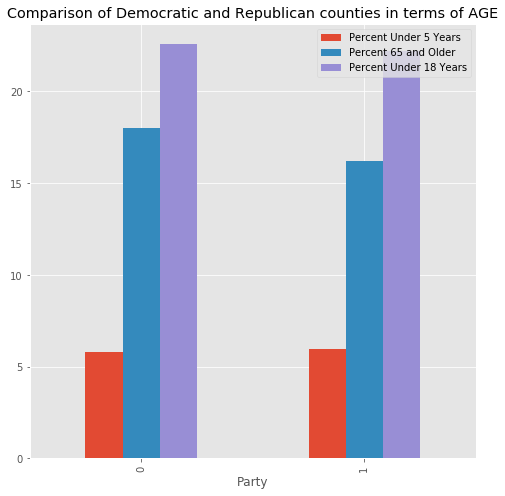

In [38]:
#Plotting bar graph for Democratic and Republican parties based on Age:

ax1 = age.plot.bar(x =['Party'],  title='Comparison of Democratic and Republican counties in terms of AGE', figsize = (8,8))

In [39]:
#Creating a separate column for Percent Male in each county
result['Percent Male'] = 100 - result['Percent Female']
#Grouping by gender and merging to form a dataset gender
female = result.groupby('Party', as_index=False)['Percent Female'].mean()
male = result.groupby('Party', as_index=False)['Percent Male'].mean()
gender = pd.merge(female,male, on=['Party'])

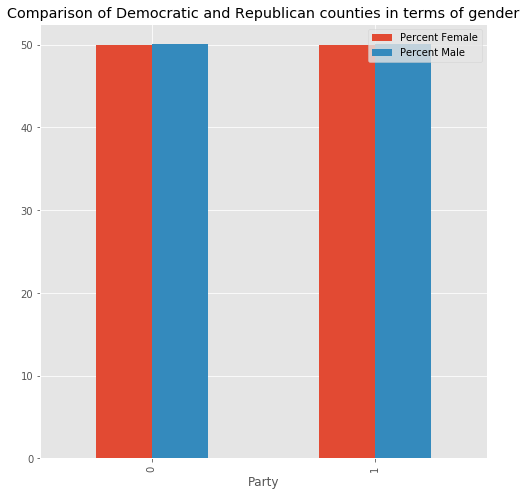

In [40]:
#Plotting Comparison between Democratic and Republican counties based on Gender:
ax2 = gender.plot.bar(x =['Party'], title = 'Comparison of Democratic and Republican counties in terms of gender', figsize=(8,8))

In [41]:
#Grouping in terms of Race:
White = result.groupby('Party', as_index=False)['Percent White'].mean()
Black = result.groupby('Party', as_index=False)['Percent Black or African American'].mean()
AmericanIndian = result.groupby('Party', as_index=False)['Percent American Indian and Alaska Native'].mean()
Asian = result.groupby('Party', as_index=False)['Percent Asian'].mean()
Hawaiian = result.groupby('Party', as_index=False)['Percent Native Hawaiian and Other Pacific Islander'].mean()
Hispanic = result.groupby('Party', as_index=False)['Percent Hispanic or Latino'].mean()

In [42]:
#Merging to form a dataset race:
race1 = pd.merge(White,Black, on=['Party'])
race2 = pd.merge(race1, AmericanIndian, on=['Party'])
race3 = pd.merge(race2, Asian, on=['Party'])
race4 = pd.merge(race3, Hawaiian, on=['Party'])
race = pd.merge(race4, Hispanic, on=['Party'])

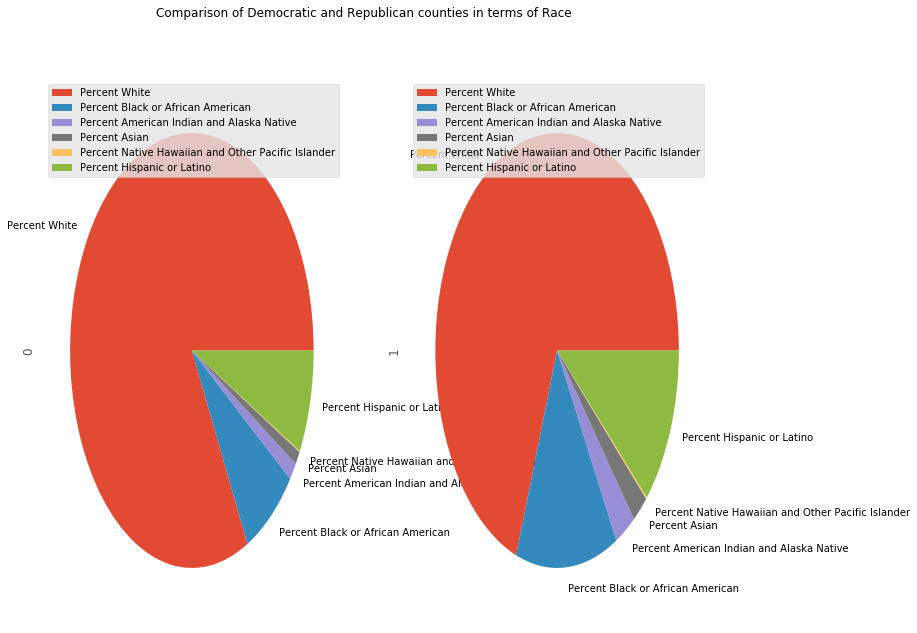

In [43]:
#Plotting Comparison of Democratic and Republic counties in terms of Race:
race_transpose = race.T
race_drop = race_transpose.drop(['Party'])
race_drop
ax3 = race_drop.plot.pie(subplots=True, figsize=(12,10), title='Comparison of Democratic and Republican counties in terms of Race')

In [44]:
race

,Party,Percent White,Percent Black or African American,Percent American Indian and Alaska Native,Percent Asian,Percent Native Hawaiian and Other Pacific Islander,Percent Hispanic or Latino
0,0,87.847896,7.878706,1.402589,1.061294,0.090291,8.141748
1,1,77.036667,15.024561,3.072456,2.415439,0.173509,13.064912


In [45]:
# Grouping and merging in terms of Education:
highSchool = result.groupby('Party', as_index=False)['Percent High School or Higher'].mean()
bachelors = result.groupby('Party', as_index=False)['Percent Bachelor\'s Degree or Higher'].mean()
education = pd.merge(highSchool,bachelors, on=['Party'])
education

,Party,Percent High School or Higher,Percent Bachelor's Degree or Higher
0,0,84.411974,18.567184
1,1,83.197544,22.489474


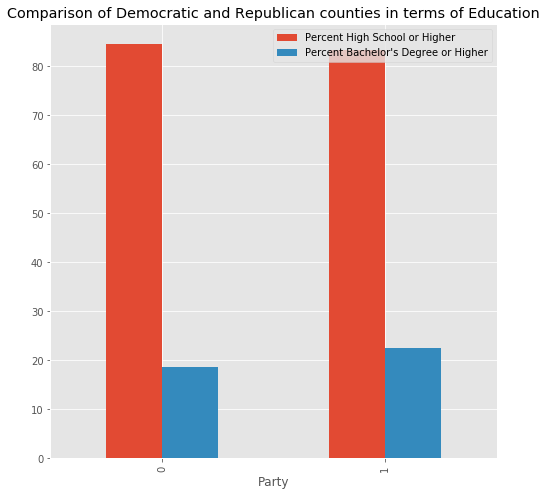

In [46]:
#Plotting Comparison of Democratic and Republican counties in terms of Education
ax4 = education.plot.bar(x =['Party'], title = 'Comparison of Democratic and Republican counties in terms of Education', figsize=(8,8))